In [1]:
!pip3 install tqdm
!pip3 install pillow --upgrade

You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 3.1 MB 7.0 MB/s eta 0:00:01
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.3.2
    Uninstalling Pillow-8.3.2:
      Successfully uninstalled Pillow-8.3.2
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [2]:
!pip install keras.utils --upgrade
!pip install tensorflow==2.6.0
!pip install awscli
!pip install s3fs

     |████████████████████████████████| 1.3 MB 7.1 MB/s eta 0:00:01
  Created wheel for keras.utils: filename=keras_utils-1.0.13-py3-none-any.whl size=2657 sha256=1cb54cdd586ae8166426575a0fccb7b9d8e818555df33eafb3c0392c8abf606b
  Stored in directory: /home/ec2-user/.cache/pip/wheels/5e/2a/9f/349ca7e8f686c62b35d549feb5c9a286c409bfa0020aefde87
Successfully built keras.utils
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.
     |████████████████████▉           | 298.2 MB 118.2 MB/s eta 0:00:02  |███▏                            | 44.7 MB 8.3 MB/s eta 0:00:51

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



     |████████████████████████████████| 458.3 MB 25 kB/s /s eta 0:00:01
     |████████████████████████████████| 4.0 MB 45.6 MB/s eta 0:00:01
     |████████████████████████████████| 5.8 MB 62.6 MB/s eta 0:00:01
     |████████████████████████████████| 132 kB 131.0 MB/s eta 0:00:01
     |████████████████████████████████| 65 kB 1.1 MB/s  eta 0:00:01
     |████████████████████████████████| 463 kB 90.3 MB/s eta 0:00:01
     |████████████████████████████████| 42 kB 2.1 MB/s  eta 0:00:01
     |████████████████████████████████| 97 kB 14.1 MB/s  eta 0:00:01
     |████████████████████████████████| 4.9 MB 37.1 MB/s eta 0:00:01
     |████████████████████████████████| 781 kB 81.7 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 76.9 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 102.4 MB/s eta 0:00:01
     |████████████████████████████████| 146 kB 125.0 MB/s eta 0:00:01
  Created wheel for clang: filename=clang-5.0-py3-none-any.whl size=30693 sha256=45d76145a40e23c7a3

In [30]:
!pip install torch
!pip install torchvision

     |███████████▊                    | 322.8 MB 167.2 MB/s eta 0:00:04

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



     |████████████████████████▋       | 677.4 MB 108.3 MB/s eta 0:00:02

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



     |████████████████████████████████| 881.9 MB 581 bytes/s a 0:00:01
You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [54]:
import os
import tarfile
import urllib
import shutil
import json
import random
import numpy as np
import boto3
import sagemaker

import torch
from torchvision import transforms
import torchvision.transforms.functional as F
from torchvision.utils import draw_segmentation_masks

from tqdm import tqdm
from sagemaker.amazon.amazon_estimator import get_image_uri
from matplotlib import pyplot as plt
from xml.etree import ElementTree as ET
from PIL import Image, ImageDraw, ImageFont

%matplotlib inline

In [4]:
# AWS configs
import awscli
import s3fs

In [5]:
import ipywidgets as widgets
from IPython.display import display

In [31]:
# Check GPU availability
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
0
1
Tesla T4


In [6]:
role = "arn:aws:iam::665113802444:role/nicholas"
bucket = 'blender-satellite-renders'

In [7]:
print(role)

arn:aws:iam::665113802444:role/nicholas


In [9]:
ls

lost+found/                 stage-clusterII-v0.tar.gz  Untitled.ipynb
Model-Exploration-v1.ipynb  Untitled1.ipynb


In [10]:
!mkdir semantic-segmentation

In [11]:
ls

lost+found/                 semantic-segmentation/     Untitled1.ipynb
Model-Exploration-v1.ipynb  stage-clusterII-v0.tar.gz  Untitled.ipynb


In [12]:
# Process Cluster II
!aws s3 cp s3://blender-satellite-renders/stage-clusterII-v0.tar.gz ./stage-clusterII-v0.tar.gz
!tar -xvzf stage-clusterII-v0.tar.gz --directory ./semantic-segmentation
!mkdir ./semantic-segmentation/clusterII_images
!mkdir ./semantic-segmentation/clusterII_masks
!mv ./semantic-segmentation/stage-clusterII-v0/image_*  ./semantic-segmentation/clusterII_images/
!mv ./semantic-segmentation/stage-clusterII-v0/mask_*  ./semantic-segmentation/clusterII_masks/

# Now, append the satellite name at the front of all base images and labeled images
for root, dirs, files in os.walk("semantic-segmentation/clusterII_images"):
    if not files:
        continue
    prefix = "ClusterII"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))

for root, dirs, files in os.walk("semantic-segmentation/clusterII_masks"):
    if not files:
        continue
    prefix = "ClusterII"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))
        
os.remove('stage-clusterII-v0.tar.gz')

._stage-clusterII-v0
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-clusterII-v0/
stage-clusterII-v0/image_842_1.png
stage-clusterII-v0/image_3417_2.png
stage-clusterII-v0/image_1188_3.png
stage-clusterII-v0/image_4944_2.png
stage-clusterII-v0/mask_1400_1.png
stage-clusterII-v0/mask_4266_1.png
stage-clusterII-v0/mask_3776_1.png
stage-clusterII-v0/image_1761_2.png
stage-clusterII-v0/image_4107_2.png
stage-clusterII-v0/image_2474_1.png
stage-clusterII-v0/mask_1892_1.png
stage-clusterII-v0/image_3885_2.png
stage-clusterII-v0/image_1559_3.png
stage-clusterII-v0/mask_2715_2.png
stage-clusterII-v0/mask_474_3.png
stage-clusterII-v0/mask_4223_1.png
stage-clusterII-v0/mask_1445_1.png
stage-clusterII-v0/mask_2381_2.png
stage-clusterII-v0/image_807_1.png
stage-clusterII-v0/image_4901_2.png
stage-clusterII-v0/image_3452_2.png
stage-clusterII-v0/image_4142_2.png
stage-clusterII-v0/image_1724_2.png
stage-clusterII-v0/mask_2568_3.png
stage-c

In [13]:
# Do the same for NEAR
!aws s3 cp s3://blender-satellite-renders/stage-NEAR-v0.tar.gz ./stage-NEAR-v0.tar.gz
!tar -xvzf stage-NEAR-v0.tar.gz --directory ./semantic-segmentation
!mkdir ./semantic-segmentation/NEAR_images
!mkdir ./semantic-segmentation/NEAR_masks
!mv ./semantic-segmentation/stage-NEAR-v0/image_*  ./semantic-segmentation/NEAR_images/
!mv ./semantic-segmentation/stage-NEAR-v0/mask_*  ./semantic-segmentation/NEAR_masks/

# Now, append the satellite name at the front of all base images and labeled images
for root, dirs, files in os.walk("semantic-segmentation/NEAR_images"):
    if not files:
        continue
    prefix = "NEAR"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))

for root, dirs, files in os.walk("semantic-segmentation/NEAR_masks"):
    if not files:
        continue
    prefix = "NEAR"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))
        
os.remove('stage-NEAR-v0.tar.gz')

download: s3://blender-satellite-renders/stage-NEAR-v0.tar.gz to ./stage-NEAR-v0.tar.gz
._stage-NEAR-v0
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-NEAR-v0/
stage-NEAR-v0/image_842_1.png
stage-NEAR-v0/image_3417_2.png
stage-NEAR-v0/image_1188_3.png
stage-NEAR-v0/image_4944_2.png
stage-NEAR-v0/mask_1400_1.png
stage-NEAR-v0/mask_4266_1.png
stage-NEAR-v0/mask_3776_1.png
stage-NEAR-v0/image_1761_2.png
stage-NEAR-v0/image_4107_2.png
stage-NEAR-v0/image_2474_1.png
stage-NEAR-v0/mask_1892_1.png
stage-NEAR-v0/image_3885_2.png
stage-NEAR-v0/image_1559_3.png
stage-NEAR-v0/mask_2715_2.png
stage-NEAR-v0/mask_474_3.png
stage-NEAR-v0/mask_4223_1.png
stage-NEAR-v0/mask_1445_1.png
stage-NEAR-v0/mask_2381_2.png
stage-NEAR-v0/image_807_1.png
stage-NEAR-v0/image_4901_2.png
stage-NEAR-v0/image_3452_2.png
stage-NEAR-v0/image_4142_2.png
stage-NEAR-v0/image_1724_2.png
stage-NEAR-v0/mask_2568_3.png
stage-NEAR-v0/mask_3733_1.png
stage-NEAR-v0/mask_

In [14]:
# Do the same for CHANDRA
!aws s3 cp s3://blender-satellite-renders/stage-chandra-v0.tar.gz ./stage-chandra-v0.tar.gz
!tar -xvzf stage-chandra-v0.tar.gz --directory ./semantic-segmentation
!mkdir ./semantic-segmentation/chandra_images
!mkdir ./semantic-segmentation/chandra_masks
!mv ./semantic-segmentation/stage-chandra-v0/image_*  ./semantic-segmentation/chandra_images/
!mv ./semantic-segmentation/stage-chandra-v0/mask_*  ./semantic-segmentation/chandra_masks/

# Now, append the satellite name at the front of all base images and labeled images
for root, dirs, files in os.walk("semantic-segmentation/chandra_images"):
    if not files:
        continue
    prefix = "chandra"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))

for root, dirs, files in os.walk("semantic-segmentation/chandra_masks"):
    if not files:
        continue
    prefix = "chandra"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))
        
os.remove('stage-chandra-v0.tar.gz')

download: s3://blender-satellite-renders/stage-chandra-v0.tar.gz to ./stage-chandra-v0.tar.gz
._stage-chandra-v0
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-chandra-v0/
stage-chandra-v0/image_842_1.png
stage-chandra-v0/image_3417_2.png
stage-chandra-v0/image_1188_3.png
stage-chandra-v0/image_4944_2.png
stage-chandra-v0/._mask_1400_1.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.macl'
stage-chandra-v0/mask_1400_1.png
stage-chandra-v0/._mask_4266_1.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.macl'
stage-chandra-v0/mask_4266_1.png
stage-chandra-v0/._mask_3776_1.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.macl'
stage-chandra-v0/mask_3776_1.png
stage-chandra-v0/._image_1761_2.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.quarantine'
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com

In [33]:
# Do the same for IBEX
!aws s3 cp s3://blender-satellite-renders/stage-ibex-v0.tar.gz ./stage-ibex-v0.tar.gz
!tar -xvzf stage-ibex-v0.tar.gz --directory ./semantic-segmentation
!mkdir ./semantic-segmentation/ibex_images
!mkdir ./semantic-segmentation/ibex_masks
!mv ./semantic-segmentation/stage-ibex-v0/image_*  ./semantic-segmentation/ibex_images/
!mv ./semantic-segmentation/stage-ibex-v0/mask_*  ./semantic-segmentation/ibex_masks/

# Now, append the satellite name at the front of all base images and labeled images
for root, dirs, files in os.walk("semantic-segmentation/ibex_images"):
    if not files:
        continue
    prefix = "ibex"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))

for root, dirs, files in os.walk("semantic-segmentation/ibex_masks"):
    if not files:
        continue
    prefix = "ibex"
    for f in files:
        os.rename(os.path.join(root, f), os.path.join(root, "{}_{}".format(prefix, f.split('_', 1)[1])))
        
os.remove('stage-ibex-v0.tar.gz')

download: s3://blender-satellite-renders/stage-ibex-v0.tar.gz to ./stage-ibex-v0.tar.gz
._stage-ibex-v0
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-ibex-v0/
stage-ibex-v0/image_842_1.png
stage-ibex-v0/._mask_4226_1 2.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-ibex-v0/mask_4226_1 2.png
stage-ibex-v0/._mask_3199_3 2.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-ibex-v0/mask_3199_3 2.png
stage-ibex-v0/image_3417_2.png
stage-ibex-v0/image_1188_3.png
stage-ibex-v0/image_4944_2.png
stage-ibex-v0/._mask_4846_3 2.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.metadata:_kMDItemUserTags'
stage-ibex-v0/mask_4846_3 2.png
stage-ibex-v0/._mask_1400_1.png
tar: Ignoring unknown extended header keyword `LIBARCHIVE.xattr.com.apple.macl'
stage-ibex-v0/mask_1400_1.png
stage-ibex-v0/

In [35]:
# Remove all the excess data
shutil.rmtree('semantic-segmentation/stage-chandra-v0', ignore_errors=True)
shutil.rmtree('semantic-segmentation/stage-ibex-v0', ignore_errors=True)
shutil.rmtree('semantic-segmentation/stage-NEAR-v0', ignore_errors=True)
shutil.rmtree('semantic-segmentation/stage-clusterII-v0', ignore_errors=True)

In [42]:
# Create a FINAL image and mask folder
os.mkdir('semantic-segmentation/Images-Final')
os.mkdir('semantic-segmentation/Masks-Final')

In [43]:
# Create folders for training and validation (base + labels)
folders = ['semantic-segmentation/Images-Final/train', 'semantic-segmentation/Images-Final/validation',
           'semantic-segmentation/Masks-Final/train', 'semantic-segmentation/Masks-Final/validation']

for folder in folders:
    if os.path.isdir(folder):
        shutil.rmtree(folder)
    os.mkdir(folder)

In [44]:
def get_map_file(image):
    map_file = image.split('.')[0] + '.png'
    assert map_file in maps
    return map_file

In [45]:
# Allocating the images to the right folders
for satellite in ['NEAR', 'chandra', 'clusterII', 'ibex']:

    image_dir = 'semantic-segmentation/' + satellite + '_images/'
    masks_dir = 'semantic-segmentation/' + satellite + '_masks/'
    images = [x for x in os.listdir(image_dir) if x[-3:] == 'png']
    maps = [x for x in os.listdir(masks_dir) if x[-3:] == 'png']

    for image in tqdm(images):
        target_set_img = 'semantic-segmentation/Images-Final/train' if random.randint(0, 99) < 80 else 'semantic-segmentation/Images-Final/validation' # 80-20 split

        target_set_mask = 'semantic-segmentation/Masks-Final/train' if target_set_img == 'semantic-segmentation/Images-Final/train' else 'semantic-segmentation/Masks-Final/validation'

        image_file_path = os.path.join(image_dir, image)
        image_target_path = os.path.join(target_set_img, image)

        map_file_path = os.path.join(masks_dir, get_map_file(image)) # Get the corresponding file from the Masks folder
        map_target_path = os.path.join(target_set_mask, get_map_file(image))

        shutil.move(image_file_path, image_target_path)
        shutil.move(map_file_path, map_target_path)

100%|██████████| 15000/15000 [00:08<00:00, 1832.22it/s]


In [46]:
train_images = os.listdir('semantic-segmentation/Images-Final/train')
valid_images = os.listdir('semantic-segmentation/Images-Final/validation')

print(len(train_images), len(valid_images))

47971 12029


In [47]:
train_masks = os.listdir('semantic-segmentation/Masks-Final/train')
valid_masks = os.listdir('semantic-segmentation/Masks-Final/validation')

print(len(train_masks), len(valid_masks))

47971 12029


In [48]:
ls semantic-segmentation/Masks-Final/train/

chandra_0_1.png     chandra_975_3.png     ClusterII_977_1.png  ibex_972_3.png
chandra_0_2.png     chandra_976_1.png     ClusterII_977_2.png  ibex_97_2.png
chandra_0_3.png     chandra_976_3.png     ClusterII_977_3.png  ibex_973_1.png
chandra_1000_1.png  chandra_977_1.png     ClusterII_978_1.png  ibex_973_2.png
chandra_1000_3.png  chandra_977_2.png     ClusterII_978_2.png  ibex_973_3.png
chandra_1001_2.png  chandra_978_2.png     ClusterII_978_3.png  ibex_97_3.png
chandra_100_1.png   chandra_978_3.png     ClusterII_979_1.png  ibex_974_1.png
chandra_1002_1.png  chandra_979_1.png     ClusterII_979_2.png  ibex_974_2.png
chandra_1002_2.png  chandra_979_2.png     ClusterII_979_3.png  ibex_974_3.png
chandra_1002_3.png  chandra_979_3.png     ClusterII_980_1.png  ibex_975_1.png
chandra_100_2.png   chandra_980_3.png     ClusterII_980_2.png  ibex_975_2.png
chandra_100_3.png   chandra_981_1.png     ClusterII_980_3.png  ibex_975_3.png
chandra_1004_1.png  chandra_981_2.png     ClusterII_981_1.png  ibe

In [217]:
# First create object labels
# This RGB list contains the RGB pairings for all eleven of our classes
rgb_list = [[1,0,0], [0,1,0], [0,0,1], [1,1,0], [1,0,1], [0,0,1], [1,0.5,0.5], [1,0.8,0.3], [0.5,1,1], [0.25,0.5,0.75], [0,0,0]]
mapping_list = ["Solar Panels", "Solar Panel Drive Shaft", "Parabolic Antenna", "Satellite Dish", "Main Module", "Telescope", "Main Thrusters", "Rotational Thrusters",
               "Sensors", "Launch Vehicle Adapter", "Background/Other Parts"]

rgb_list = torch.from_numpy(np.asarray(rgb_list))

obj_list = []

for rgb in rgb_list:
    # This calculation basically gives me a single UNIQUE value for each RGB pairing
    value = torch.round(rgb[0]) + torch.round(rgb[1] * 100) + torch.round(rgb[2] * 10000)
    obj_list.append(value)

obj_list = torch.stack(obj_list).int()
# Obj_list thus contains a unique value for each of our classes based on the special calculation we did earlier

In [218]:
obj_list

tensor([    1,   100, 10000,   101, 10001, 10000,  5051,  3081, 10100,  7550,
            0], dtype=torch.int32)

In [219]:
obj_list[0]

tensor(1, dtype=torch.int32)

In [220]:
# Map a given color value to the closest value in a given list
#def map_to_closest(value, list_of_values):
    #index = 0
    #smallest_diff = torch.tensor(99999, dtype=torch.float64)
    #for i in range(len(list_of_values)):
        #if torch.abs(list_of_values[i] - value) < smallest_diff:
            #index = i
            #smallest_diff = torch.abs(list_of_values[i] - value)
    #return list_of_values[index]

In [221]:
#map_to_closest(torch.tensor(100.1, dtype=torch.float64), obj_list)

tensor(100, dtype=torch.int32)

In [222]:
#map_to_closest(torch.tensor(0.01, dtype=torch.float64), obj_list)

tensor(0, dtype=torch.int32)

In [347]:
def convert_to_labels(mask):
    mask_tensor = convert_tensor(mask)
    #mask_tensor = torch.round(mask_tensor * 20)/ 20 # Map each RGB value to the closest 0.05 (out of 1). This allows for slight differences in the colors
    #mask_tensor = torch.nn.functional.threshold(mask_tensor, threshold = 0.1, value = 0) # Map everything below 0.1 to 0
    red_values = torch.FloatTensor([0,0.25,0.5,1])
    green_values = torch.FloatTensor([0,0.5,0.8,1])
    blue_values = torch.FloatTensor([0,0.3,0.5,0.75,1])
    
    # For each of my color values, I map them to the closest "standard" color value (in the red/green/blue values list)
    mask_tensor[0] = torch.where(mask_tensor[0]<torch.tensor(0.125), torch.tensor(0.), mask_tensor[0])
    mask_tensor[0] = torch.where((mask_tensor[0]>=torch.tensor(0.125)) & (mask_tensor[0]<torch.tensor(0.375)), torch.tensor(0.25), mask_tensor[0])
    mask_tensor[0] = torch.where((mask_tensor[0]>=torch.tensor(0.375)) & (mask_tensor[0]<torch.tensor(0.75)), torch.tensor(0.5), mask_tensor[0])
    mask_tensor[0] = torch.where((mask_tensor[0]>=torch.tensor(0.75)), torch.tensor(1.), mask_tensor[0])
    
    mask_tensor[1] = torch.where(mask_tensor[1]<torch.tensor(0.25), torch.tensor(0.), mask_tensor[1])
    mask_tensor[1] = torch.where((mask_tensor[1]>=torch.tensor(0.25)) & (mask_tensor[1]<torch.tensor(0.65)), torch.tensor(0.5), mask_tensor[1])
    mask_tensor[1] = torch.where((mask_tensor[1]>=torch.tensor(0.65)) & (mask_tensor[1]<torch.tensor(0.9)), torch.tensor(0.8), mask_tensor[1])
    mask_tensor[1] = torch.where((mask_tensor[1]>=torch.tensor(0.9)), torch.tensor(1.), mask_tensor[1])
    
    mask_tensor[2] = torch.where(mask_tensor[2]<torch.tensor(0.15), torch.tensor(0.), mask_tensor[2])
    mask_tensor[2] = torch.where((mask_tensor[2]>=torch.tensor(0.15)) & (mask_tensor[2]<torch.tensor(0.4)), torch.tensor(0.3), mask_tensor[2])
    mask_tensor[2] = torch.where((mask_tensor[2]>=torch.tensor(0.4)) & (mask_tensor[2]<torch.tensor(0.625)), torch.tensor(0.5), mask_tensor[2])
    mask_tensor[2] = torch.where((mask_tensor[2]>=torch.tensor(0.625)) & (mask_tensor[2]<torch.tensor(0.875)), torch.tensor(0.75), mask_tensor[2])
    mask_tensor[2] = torch.where((mask_tensor[2]>=torch.tensor(0.875)), torch.tensor(1.), mask_tensor[2])
    
    new_mask_tensor = mask_tensor[0] + torch.round(mask_tensor[1] * 100) + torch.round(mask_tensor[2] * 10000) # Deconflicts RGB
    new_mask_tensor = new_mask_tensor.unsqueeze(0).int()
    masks = new_mask_tensor == obj_list[:, None, None]
    return masks

def check_present_classes(converted_mask):
    present_classes = []
    for i in range(11):
        if not torch.all(converted_mask[i] == False):
            present_classes.append(mapping_list[i])
    print(present_classes)
    print("Num of classes present: " + str(len(present_classes)) + "/11")

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        plt.figure()
        plt.imshow(np.asarray(img))

def draw_class_masks(converted_mask, base_image):
    drawn_masks = []
    img_tensor = convert_tensor(base_image)
    for mask in converted_mask:
        drawn_masks.append(draw_segmentation_masks(torch.round(img_tensor*255).to(torch.uint8), mask, alpha = 0.8, colors = "blue"))
        # This produces 11 pictures. If the corresponding part is inside the picture, color it blue.
    show(drawn_masks)

In [414]:
mask_tmp = Image.open("semantic-segmentation/Masks-Final/train/chandra_100_1.png")

In [415]:
mask_tmp_cool = convert_to_labels(mask_tmp)

In [416]:
check_present_classes(mask_tmp_cool)

['Solar Panels', 'Solar Panel Drive Shaft', 'Parabolic Antenna', 'Main Module', 'Telescope', 'Main Thrusters', 'Rotational Thrusters', 'Sensors', 'Background/Other Parts']
Num of classes present: 9/11


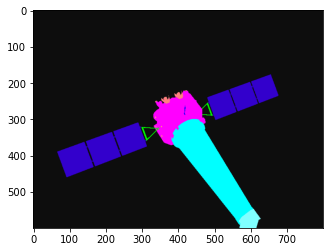

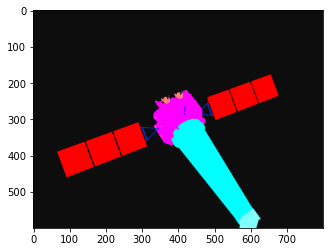

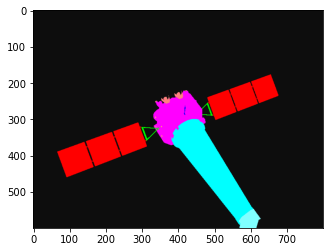

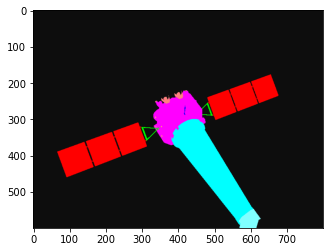

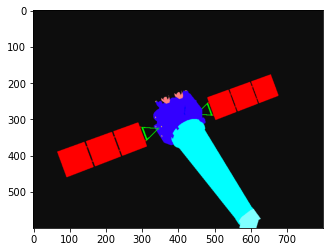

...

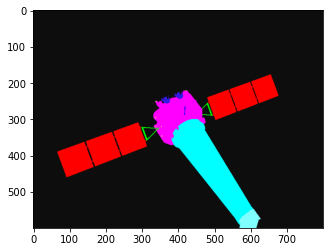

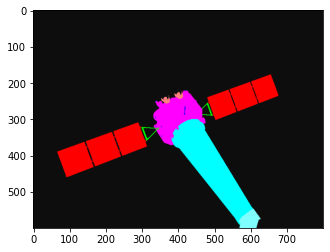

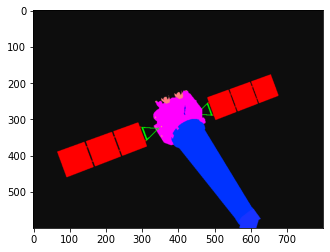

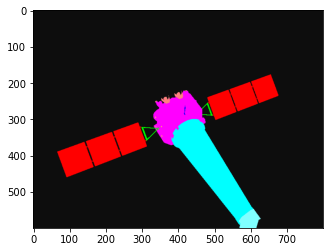

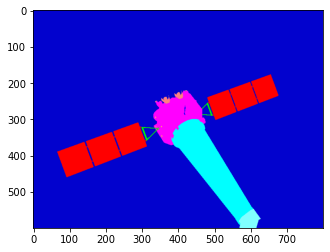

In [417]:
draw_class_masks(mask_tmp_cool, mask_tmp)

In [ ]:
# Process my MASKS accordingly